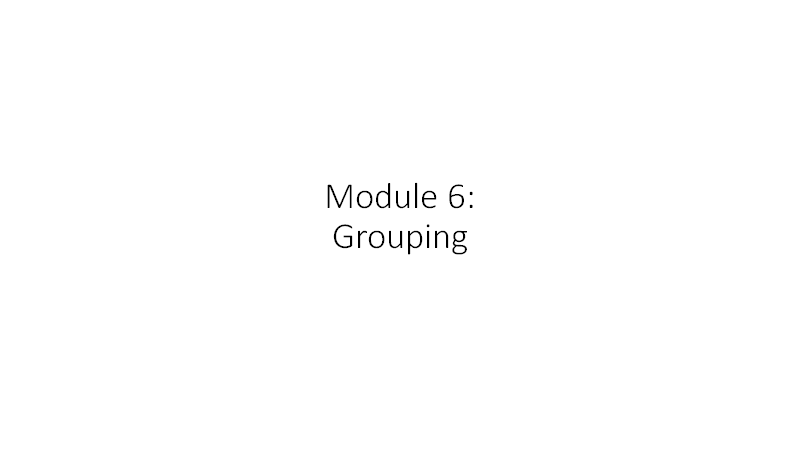

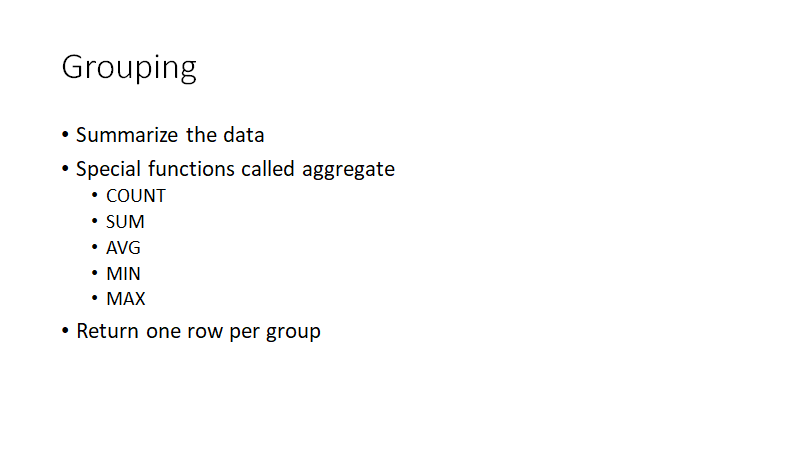

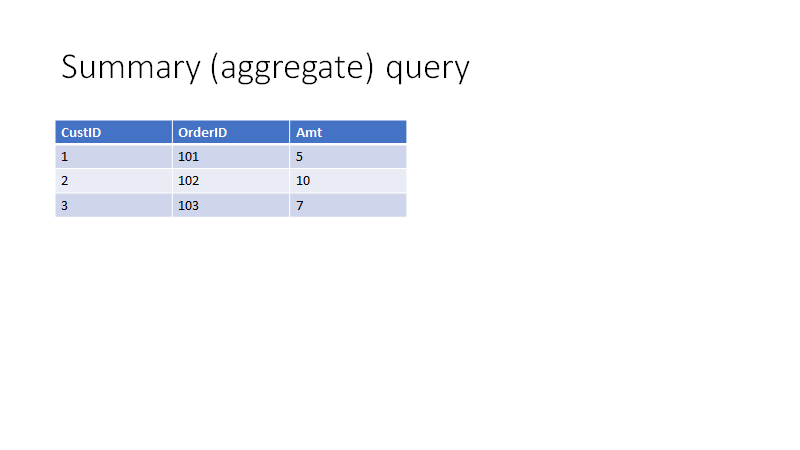

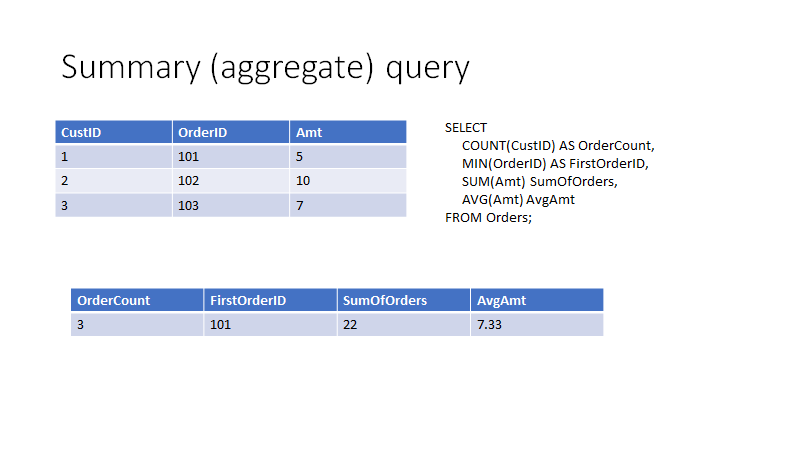

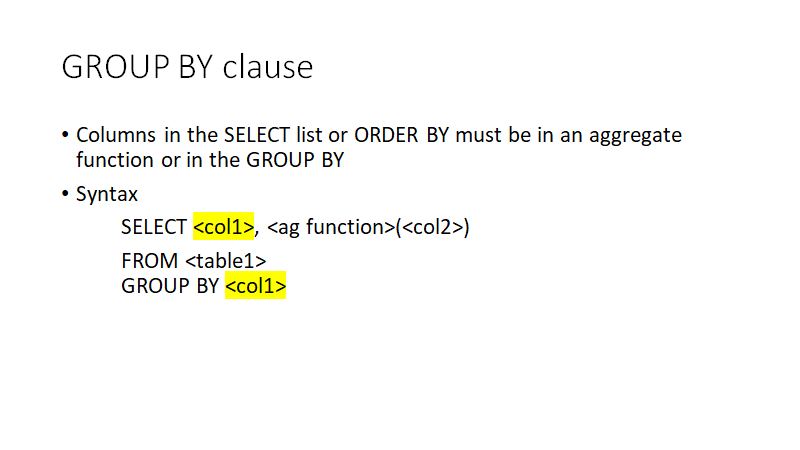

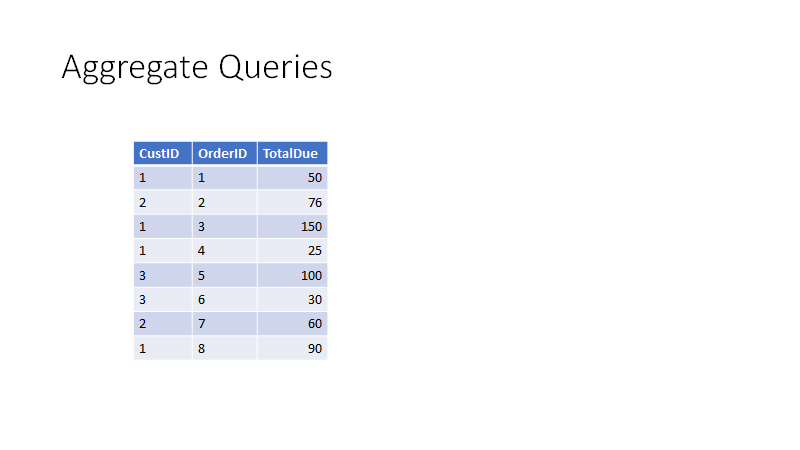

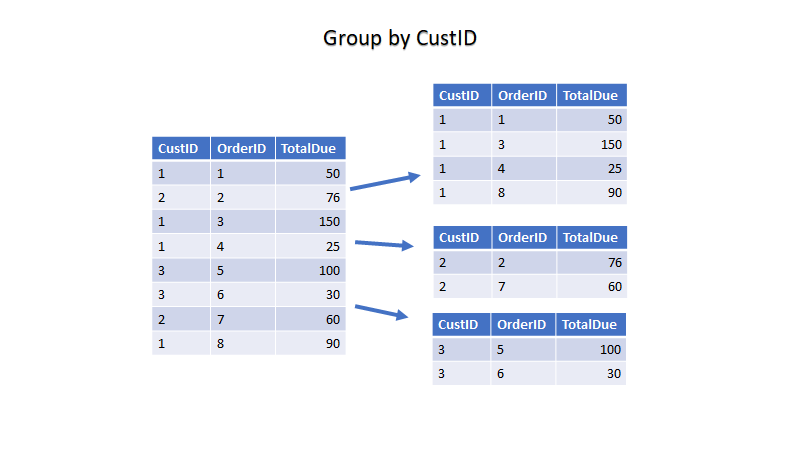

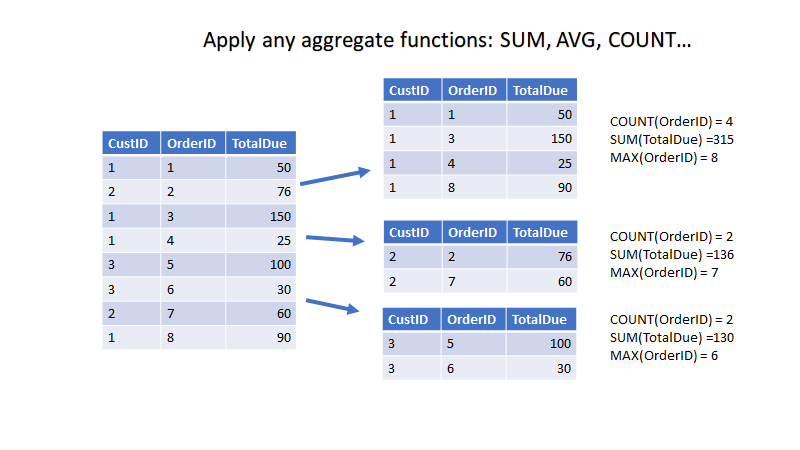

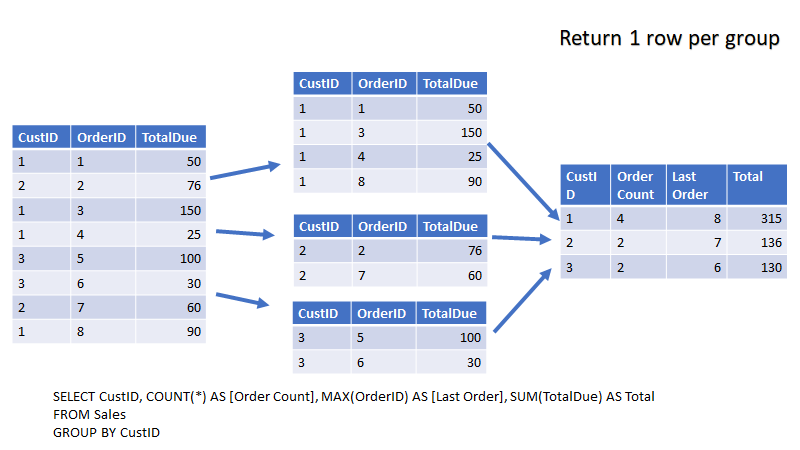

In [1]:
USE AdventureWorks2019
GO

--Module 6
--Demo 1 Using Aggregate Functions 
SELECT COUNT(*) AS CountOfRows,        
	MAX(TotalDue) AS MaxTotal,        
	MIN(TotalDue) AS MinTotal,        
	SUM(TotalDue) AS SumOfTotal,        
	AVG(TotalDue) AS AvgTotal    
FROM Sales.SalesOrderHeader;  

Commands completed successfully.

(1 row affected)

Total execution time: 00:00:00.173

CountOfRows,MaxTotal,MinTotal,SumOfTotal,AvgTotal
31465,187487.8250,1.5183,123216786.1159,3915.9951


In [4]:
--You can also use MIN and MAX on dates and strings    
SELECT MIN(Name) AS MinName,        
	MAX(Name) AS MaxName,        
	MIN(SellStartDate) AS MinSellStartDate    
FROM Production.Product;  

(1 row affected)

Total execution time: 00:00:00.064

MinName,MaxName,MinSellStartDate
Adjustable Race,"Women's Tights, S",2008-04-30 00:00:00.000


In [5]:
--What's the difference in these?    
SELECT COUNT(*) AS CountOfRows,        
	COUNT(Color) AS CountOfColor,            
	COUNT(DISTINCT Color) AS CountOfDistinctColor    
FROM Production.Product;  

Warning: Null value is eliminated by an aggregate or other SET operation.

(1 row affected)

Total execution time: 00:00:00.059

CountOfRows,CountOfColor,CountOfDistinctColor
504,256,9


In [ ]:
--Will fail
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer    
FROM Sales.SalesOrderHeader;  

In [6]:
 --Using the GROUP BY Clause       
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer  , COUNT(*)
FROM Sales.SalesOrderHeader    
GROUP BY CustomerID;  

(19119 rows affected)

Displaying Top 5000 rows.

Total execution time: 00:00:00.240

CustomerID,TotalPerCustomer,(No column name)
14324,5659.1783,3
22814,5.5140,1
11407,59.6590,1
28387,645.2869,1
19897,659.6408,1
15675,7963.0500,3
24165,3366.7583,2
27036,8.0444,1
18546,32.5754,1
11453,9035.5630,3


In [7]:
--5659.1783
SELECT CustomerID, TotalDue
FROM Sales.SalesOrderHeader
WHERE CustomerID = 14324

(3 rows affected)

Total execution time: 00:00:00.057

CustomerID,TotalDue
14324,2264.2536
14324,858.9607
14324,2535.9640


In [ ]:
--    Won't run even though territoryID is in a function
SELECT TerritoryID,AVG(TotalDue) AS AveragePerTerritory  
 , 	MIN(TerritoryID)
FROM Sales.SalesOrderHeader 

In [ ]:
--How to Group on an Expression 
--This query will return one row per date, not year
SELECT COUNT(*) AS CountOfOrders, YEAR(OrderDate) AS OrderYear    
FROM Sales.SalesOrderHeader    
GROUP BY OrderDate; 

In [ ]:
--Always use the exact expression to get the right results    
SELECT COUNT(*) AS CountOfOrders, YEAR(OrderDate) AS OrderYear    
FROM Sales.SalesOrderHeader    
GROUP BY YEAR(OrderDate); 

In [ ]:
--Won't run, must use expression
SELECT COUNT(*) AS CountOfOrders, YEAR(OrderDate) AS OrderYear    
FROM Sales.SalesOrderHeader    
GROUP BY OrderYear; 

In [ ]:
--Using ORDER BY 
--Order on a column   
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer          
FROM Sales.SalesOrderHeader    
GROUP BY CustomerID   
ORDER BY CustomerID;  

In [ ]:
--Order on an aggregate    
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer    
FROM Sales.SalesOrderHeader    
GROUP BY CustomerID    
ORDER BY MAX(TotalDue) DESC;

In [ ]:
--If order by OrderDate, must add to Group by. Now not getting
--one row per customer
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer    
FROM Sales.SalesOrderHeader    
GROUP BY CustomerID , OrderDate   
ORDER BY OrderDate DESC;

In [ ]:
--Writing Aggregate Queries with Two Tables    
SELECT c.CustomerID, c.AccountNumber, COUNT(*) AS CountOfOrders,        
	SUM(TotalDue) AS SumOfTotalDue , YEAR(OrderDate) AS OrderYear 
FROM Sales.Customer AS c    
INNER JOIN Sales.SalesOrderHeader AS s ON c.CustomerID = s.CustomerID    
GROUP BY c.CustomerID, c.AccountNumber, YEAR(OrderDate)    
ORDER BY c.CustomerID;  

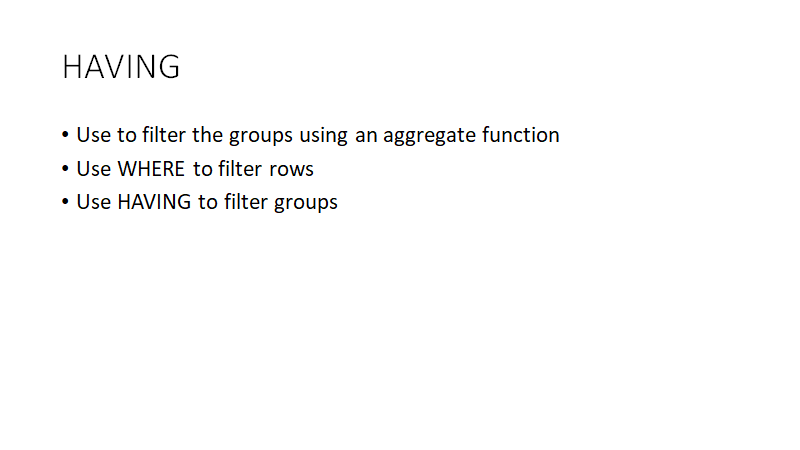

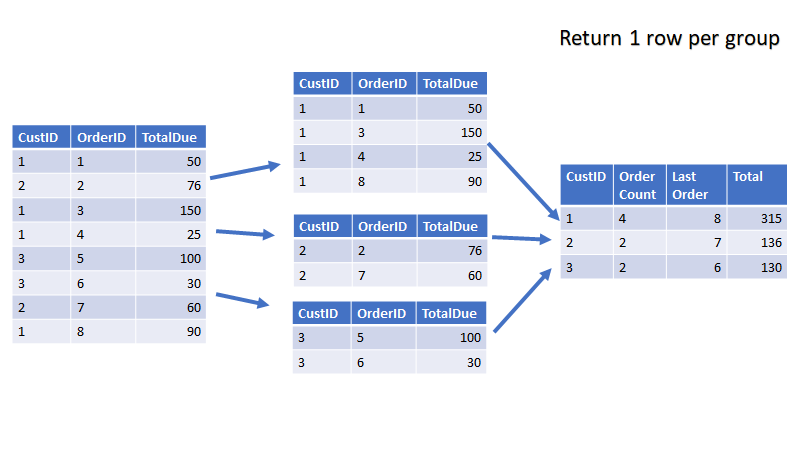

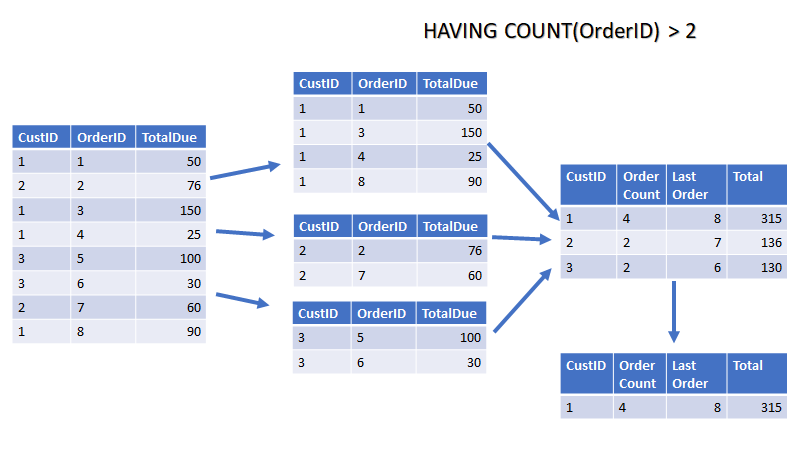

In [4]:
SELECT *
FROM Sales.SalesOrderHeader 

(31465 rows affected)

Displaying Top 5000 rows.

Total execution time: 00:00:03.101

SalesOrderID,RevisionNumber,OrderDate,DueDate,ShipDate,Status,OnlineOrderFlag,SalesOrderNumber,PurchaseOrderNumber,AccountNumber,CustomerID,SalesPersonID,TerritoryID,BillToAddressID,ShipToAddressID,ShipMethodID,CreditCardID,CreditCardApprovalCode,CurrencyRateID,SubTotal,TaxAmt,Freight,TotalDue,Comment,rowguid,ModifiedDate
43659,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43659,PO522145787,10-4020-000676,29825,279,5,985,985,5,16281,105041Vi84182,NULL,20565.6206,1971.5149,616.0984,23153.2339,NULL,79b65321-39ca-4115-9cba-8fe0903e12e6,2011-06-07 00:00:00.000
43660,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43660,PO18850127500,10-4020-000117,29672,279,5,921,921,5,5618,115213Vi29411,NULL,1294.2529,124.2483,38.8276,1457.3288,NULL,738dc42d-d03b-48a1-9822-f95a67ea7389,2011-06-07 00:00:00.000
43661,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43661,PO18473189620,10-4020-000442,29734,282,6,517,517,5,1346,85274Vi6854,4,32726.4786,3153.7696,985.5530,36865.8012,NULL,d91b9131-18a4-4a11-bc3a-90b6f53e9d74,2011-06-07 00:00:00.000
43662,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43662,PO18444174044,10-4020-000227,29994,282,6,482,482,5,10456,125295Vi53935,4,28832.5289,2775.1646,867.2389,32474.9324,NULL,4a1ecfc0-cc3a-4740-b028-1c50bb48711c,2011-06-07 00:00:00.000
43663,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43663,PO18009186470,10-4020-000510,29565,276,4,1073,1073,5,4322,45303Vi22691,NULL,419.4589,40.2681,12.5838,472.3108,NULL,9b1e7a40-6ae0-4ad3-811c-a64951857c4b,2011-06-07 00:00:00.000
43664,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43664,PO16617121983,10-4020-000397,29898,280,1,876,876,5,806,95555Vi4081,NULL,24432.6088,2344.9921,732.8100,27510.4109,NULL,22a8a5da-8c22-42ad-9241-839489b6ef0d,2011-06-07 00:00:00.000
43665,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43665,PO16588191572,10-4020-000146,29580,283,1,849,849,5,15232,35568Vi78804,NULL,14352.7713,1375.9427,429.9821,16158.6961,NULL,5602c304-853c-43d7-9e79-76e320d476cf,2011-06-07 00:00:00.000
43666,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43666,PO16008173883,10-4020-000511,30052,276,4,1074,1074,5,13349,105623Vi69217,NULL,5056.4896,486.3747,151.9921,5694.8564,NULL,e2a90057-1366-4487-8a7e-8085845ff770,2011-06-07 00:00:00.000
43667,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43667,PO15428132599,10-4020-000646,29974,277,3,629,629,5,10370,55680Vi53503,NULL,6107.0820,586.1203,183.1626,6876.3649,NULL,86d5237d-432d-4b21-8abc-671942f5789d,2011-06-07 00:00:00.000
43668,8,2011-05-31 00:00:00.000,2011-06-12 00:00:00.000,2011-06-07 00:00:00.000,5,0,SO43668,PO14732180295,10-4020-000514,29614,282,6,529,529,5,1566,85817Vi8045,4,35944.1562,3461.7654,1081.8017,40487.7233,NULL,281cc355-d538-494e-9b44-461b36a826c6,2011-06-07 00:00:00.000


In [3]:
--Demo 2: HAVING
--Using the WHERE Clause       
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer    
FROM Sales.SalesOrderHeader    
WHERE TerritoryID in (5,6)    
GROUP BY CustomerID; 


(1768 rows affected)

Total execution time: 00:00:00.202

CustomerID,TotalPerCustomer
18546,32.5754
29761,68068.6803
17026,288.8360
18523,177.8388
12781,2574.6279
27082,865.2040
18377,2646.4419
23455,14.2987
13491,194.9331
15157,236.4037


In [ ]:
--Using the HAVING Clause    
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer    
FROM Sales.SalesOrderHeader    
GROUP BY CustomerID    
HAVING SUM(TotalDue) > 5000; 

In [ ]:
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer    
FROM Sales.SalesOrderHeader    
GROUP BY CustomerID    
HAVING COUNT(*) = 10 AND SUM(TotalDue) > 5000;      

In [ ]:
--Still works, but incorrect method    
SELECT CustomerID,SUM(TotalDue) AS TotalPerCustomer    
FROM Sales.SalesOrderHeader    
GROUP BY CustomerID    
HAVING CustomerID > 27858;   